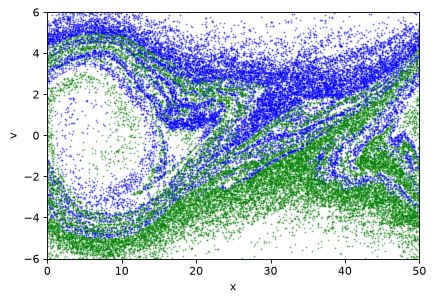

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse as sp
from scipy.sparse.linalg import spsolve
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

"""
Create Your Own Plasma PIC Simulation (With Python)
Simulate the 1D Two-Stream Instability
"""

def getAcc(pos, Nx, boxsize, n0, Gmtx, Lmtx):
    # Calculate Electron Number Density on the Mesh
    N = pos.shape[0]
    dx = boxsize / Nx
    j = np.floor(pos / dx).astype(int)
    jp1 = j + 1
    weight_j = (jp1 * dx - pos) / dx
    weight_jp1 = (pos - j * dx) / dx
    jp1 = np.mod(jp1, Nx)  # periodic BC
    n = np.bincount(j[:, 0], weights=weight_j[:, 0], minlength=Nx)
    n += np.bincount(jp1[:, 0], weights=weight_jp1[:, 0], minlength=Nx)
    n *= n0 * boxsize / N / dx

    # Solve Poisson's Equation: laplacian(phi) = n-n0
    phi_grid = spsolve(Lmtx, n - n0, permc_spec="MMD_AT_PLUS_A")

    # Apply Derivative to get the Electric field
    E_grid = -Gmtx @ phi_grid

    # Interpolate grid value onto particle locations
    E = weight_j * E_grid[j] + weight_jp1 * E_grid[jp1]
    a = -E

    return a


# 1. Initialization and Setup
# Simulation parameters
N = 40000     # Number of particles
Nx = 400      # Number of mesh cells
tEnd = 50     # time at which simulation ends
dt = 1        # timestep
boxsize = 50  # periodic domain [0,boxsize]
n0 = 1        # electron number density
vb = 3        # beam velocity
vth = 1       # beam width
A = 0.1       # perturbation

# Generate Initial Conditions
np.random.seed(42)
pos = np.random.rand(N, 1) * boxsize
vel = vth * np.random.randn(N, 1) + vb
Nh = int(N / 2)
vel[Nh:] *= -1
vel *= 1 + A * np.sin(2 * np.pi * pos / boxsize)

# Construct matrix G to compute Gradient (1st derivative)
dx = boxsize / Nx
e = np.ones(Nx)
diags = np.array([-1, 1])
vals = np.vstack((-e, e))
Gmtx = sp.spdiags(vals, diags, Nx, Nx).tolil()
Gmtx[0, Nx - 1] = -1
Gmtx[Nx - 1, 0] = 1
Gmtx /= 2 * dx
Gmtx = Gmtx.tocsr()

# Construct matrix L to compute Laplacian (2nd derivative)
diags = np.array([-1, 0, 1])
vals = np.vstack((e, -2 * e, e))
Lmtx = sp.spdiags(vals, diags, Nx, Nx).tolil()
Lmtx[0, Nx - 1] = 1
Lmtx[Nx - 1, 0] = 1
Lmtx /= dx**2
Lmtx = Lmtx.tocsr()

# Calculate initial accelerations
acc = getAcc(pos, Nx, boxsize, n0, Gmtx, Lmtx)


fig, ax = plt.subplots(figsize=(6, 4), dpi=80)
ax.set_xlim(0, boxsize)
ax.set_ylim(-6, 6)
ax.set_xlabel("x")
ax.set_ylabel("v")

# Plot initial state and keep references to the scatter objects
scatter1 = ax.scatter(pos[0:Nh], vel[0:Nh], s=0.4, color="blue", alpha=0.5)
scatter2 = ax.scatter(pos[Nh:], vel[Nh:], s=0.4, color="green", alpha=0.5)


def update_frame(frame):
    global pos, vel, acc
    
    # (1/2) kick
    vel += acc * dt / 2.0
    
    # drift (and apply periodic boundary conditions)
    pos += vel * dt
    pos = np.mod(pos, boxsize)
    
    # update accelerations
    acc = getAcc(pos, Nx, boxsize, n0, Gmtx, Lmtx)
    
    # (1/2) kick
    vel += acc * dt / 2.0
    
    # Update scatter plot data (faster than clearing and redrawing)
    scatter1.set_offsets(np.column_stack((pos[0:Nh], vel[0:Nh])))
    scatter2.set_offsets(np.column_stack((pos[Nh:], vel[Nh:])))
    
    # Return the modified artists for blitting
    return scatter1, scatter2


Nt = int(np.ceil(tEnd / dt))

ani = FuncAnimation(
    fig,
    update_frame,
    frames=Nt,
    interval=50, # Milliseconds between frames
    blit=True
)

# To display in a Jupyter Notebook
HTML(ani.to_jshtml())